In [1]:
import numpy as np
import csv
import pandas as pd
np.random.seed(42)

df = pd.read_csv('cs305fp_music_genre.csv')
df = df.fillna(0)
df

X = df.iloc[:, :-1]  
y = df.iloc[:, -1]  
y.unique()

array(['Electronic', 'Anime', 0, 'Jazz', 'Alternative', 'Country', 'Rap',
       'Blues', 'Rock', 'Classical', 'Hip-Hop'], dtype=object)

In [2]:
df = df.fillna(0)
df.iloc[0:10,:]

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894.0,Röyksopp,Röyksopp's Night Out,27.0,0.00468,0.652,-1.0,0.941,0.792000,A#,0.1150,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652.0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,218293.0,0.890,0.950000,D,0.1240,-7.043,Minor,0.0300,115.00200000000001,4-Apr,0.531,Electronic
2,30097.0,Dillon Francis,Hurricane,28.0,0.00306,0.620,215613.0,0.755,0.011800,G#,0.5340,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177.0,Dubloadz,Nitro,34.0,0.02540,0.774,166875.0,0.700,0.002530,C#,0.1570,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907.0,What So Not,Divide & Conquer,32.0,0.00465,0.638,222369.0,0.587,0.909000,F#,0.1570,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic
5,89064.0,Axel Boman,Hello,47.0,0.00523,0.755,519468.0,0.731,0.854000,D,0.2160,-10.517,Minor,0.0412,?,4-Apr,0.614,Electronic
6,43760.0,Jordan Comolli,Clash,46.0,0.02890,0.572,214408.0,0.803,0.000008,B,0.1060,-4.294,Major,0.3510,149.995,4-Apr,0.230,Electronic
7,30738.0,Hraach,Delirio,43.0,0.02970,0.809,416132.0,0.706,0.903000,G,0.0635,-9.339,Minor,0.0484,120.008,4-Apr,0.761,Electronic
8,84950.0,Kayzo,NEVER ALONE,39.0,0.00299,0.509,292800.0,0.921,0.000276,F,0.1780,-3.175,Minor,0.2680,149.94799999999998,4-Apr,0.273,Electronic
9,56950.0,Shlump,Lazer Beam,22.0,0.00934,0.578,204800.0,0.731,0.011200,A,0.1110,-7.091,Minor,0.1730,139.933,4-Apr,0.203,Electronic


In [3]:
df.columns

Index(['instance_id', 'artist_name', 'track_name', 'popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'obtained_date', 'valence', 'music_genre'],
      dtype='object')

In [4]:
counter = 0
for i in range(df.shape[0]):
    if df.iloc[i,17] == -1.0:
        counter+=1
        
counter


0

In [5]:
df.groupby(['music_genre']).count()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
music_genre,,,,,,,,,,,,,,,,,
0,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
Alternative,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Anime,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Blues,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Classical,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Country,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Electronic,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Hip-Hop,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000
Jazz,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000,5000


In [6]:
import collections
alst = df["artist_name"].tolist()
counts = collections.Counter(alst)
dict1 = {k: v for k, v in sorted(counts.items(), key=lambda item: item[1])}
alst1 = list(dict1.keys())
alist = alst1[-21:-1]
alist1 = alist[::-1]
alist1

['Nobuo Uematsu',
 'Wolfgang Amadeus Mozart',
 'Ludwig van Beethoven',
 'Johann Sebastian Bach',
 'Frédéric Chopin',
 'Drake',
 'Capcom Sound Team',
 'Yuki Hayashi',
 'Eminem',
 'Future',
 'Thievery Corporation',
 'The Black Keys',
 'Pyotr Ilyich Tchaikovsky',
 'Kevin Gates',
 'Mac Miller',
 'Howard Shore',
 '$uicideBoy$',
 'Logic',
 'Ryuichi Sakamoto',
 'ASIAN KUNG-FU GENERATION']

In [7]:
vdf = df.groupby('artist_name').count()
vdf1 = vdf.sort_values(by=['instance_id'], ascending = False)
vdf1 = vdf1.iloc[1:21,0:1]
vdf1['a_name'] = alist1
vdf1= vdf1.reset_index()
vdf1

,artist_name,instance_id,a_name
0,Nobuo Uematsu,429,Nobuo Uematsu
1,Wolfgang Amadeus Mozart,402,Wolfgang Amadeus Mozart
2,Ludwig van Beethoven,317,Ludwig van Beethoven
3,Johann Sebastian Bach,314,Johann Sebastian Bach
4,Frédéric Chopin,241,Frédéric Chopin
5,Drake,172,Drake
6,Capcom Sound Team,169,Capcom Sound Team
7,Yuki Hayashi,167,Yuki Hayashi
8,Eminem,147,Eminem
9,Future,124,Future


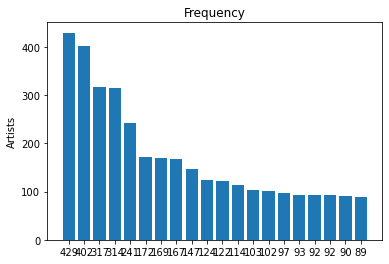

In [8]:
import matplotlib.pyplot as plt
artists = vdf1.iloc[:,0]
freq = vdf1.iloc[:,1]

plt.bar(range(len(artists)), freq)
plt.ylabel("Artists")
plt.title("Frequency")

# label x-axis with movie names by providing indices 0, 1, 2, etc. and labels for each tick
plt.xticks(range(len(artists)), freq)
plt.show()

In [9]:
import plotly.express as px
fig = px.bar(vdf1, x="a_name", y='instance_id',hover_data=["a_name","instance_id"],
             color='instance_id',
             labels={'a_name':'Artist', 'instance_id':'Frequency'})
fig.show()

In [18]:
# Relationship between danceability and duration given genre
#removing all negative floats
dur = df.iloc[:,6]
for i in range(len(dur)):
    if dur[i] < 0.0:
        dur[i] = 0.00
        
#finding the average of the duration of the songs (in milliseconds)
avg = np.sum(dur) / len(dur)
avg

#replacing all 0.0 values
for i in range(len(dur)):
    if dur[i] == 0.0:
        dur[i] = avg
        
df.iloc[:,6] = dur

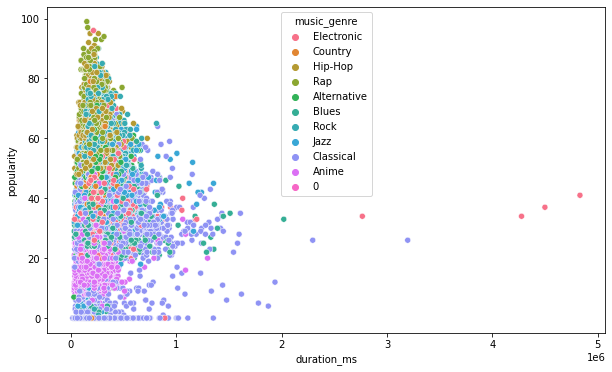

In [25]:
import seaborn as sns
from sklearn.utils import shuffle
import random

random.seed(17)
vd2 = shuffle(df)
# vdf2 = vd2.iloc[0:1000,:]


plt.figure(figsize=(10,6))
fig1 = sns.scatterplot(data=vd2, 
                       x="duration_ms", 
                       y="popularity", 
                       hue="music_genre")

In [26]:
fig1 = px.scatter(df, x="duration_ms", y="popularity", 
                  hover_data=["artist_name", "track_name","popularity"], 
                  color="music_genre") 
fig1.show()

In [27]:
visdf = df.drop(["instance_id", "artist_name", "track_name", "acousticness", "danceability","energy", "valence",
        "instrumentalness","key", "liveness", "loudness", "mode", "speechiness","tempo", "obtained_date"], axis = 1)
visdf2 = visdf.groupby(by = ["music_genre"]).mean()
visdf2 = visdf2.drop([0])

genres = df['music_genre'].unique()
genres = np.delete(genres, 2)
genres

array(['Electronic', 'Anime', 'Jazz', 'Alternative', 'Country', 'Rap',
       'Blues', 'Rock', 'Classical', 'Hip-Hop'], dtype=object)

In [28]:
fig1 = px.scatter(visdf2, x="duration_ms", y="popularity",  
                  color= genres,
                 size= "duration_ms") 
                  
fig1.show()